## CREStereo

Ключевая идея — Cascaded Recurrent Stereo Network: сеть предсказывает диспаритет не за один проход, а каскадно, с последовательным уточнением результата. На каждом шаге используется рекуррентный модуль, который исправляет ошибки предыдущего слоя и добавляет детали. В отличие от RAFT-Stereo, CREStereo специально оптимизирована под баланс между качеством и скоростью.

In [11]:
import os
import sys
from pathlib import Path

import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt

DEVICE = "mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu")
REPO_CANDIDATE_NAMES = ("CREStereo-Pytorch", "CREStereo")

def ensure_crestereo_on_path(max_depth: int = 6) -> Path:
    """Locate a local CREStereo PyTorch repo and add it to sys.path."""
    roots = []
    current = Path.cwd().resolve()
    for _ in range(max_depth + 1):
        roots.append(current)
        current = current.parent
    roots.append(Path.home().resolve())
    seen = set()
    for root in roots:
        if root in seen:
            continue
        seen.add(root)
        for name in REPO_CANDIDATE_NAMES:
            candidate = (root / name).resolve()
            nets_file = candidate / "nets" / "crestereo.py"
            if nets_file.is_file():
                try:
                    head = nets_file.open(encoding="utf-8").read(512)
                except OSError:
                    continue
                if "import torch" not in head:
                    continue
                candidate_str = str(candidate)
                if candidate_str not in sys.path:
                    sys.path.insert(0, candidate_str)
                return candidate
    raise ModuleNotFoundError("Не удалось найти локальную копию CREStereo-Pytorch. Клонируйте https://github.com/ibaiGorordo/CREStereo-Pytorch рядом с проектом или в домашней директории.")

def find_crestereo_checkpoint(repo_root: Path) -> Path:
    """Try to locate the ETH3D checkpoint near the repo."""
    repo_root = repo_root.resolve()
    candidates = [repo_root / "models" / "crestereo_eth3d.pth"]
    neighbours = [
        repo_root.parent / "CREStereo",
        repo_root.parent / "CREStereo-Pytorch",
        Path.home() / "CREStereo",
        Path.home() / "CREStereo-Pytorch",
        Path.cwd().resolve().parent / "CREStereo",
        Path.cwd().resolve().parent / "CREStereo-Pytorch",
    ]
    seen = set()
    for base in neighbours:
        if base is None:
            continue
        try:
            base = base.resolve()
        except FileNotFoundError:
            continue
        if base in seen:
            continue
        seen.add(base)
        candidates.append(base / "models" / "crestereo_eth3d.pth")
    checked = set()
    for path in candidates:
        try:
            resolved = path.resolve()
        except FileNotFoundError:
            continue
        if resolved in checked:
            continue
        checked.add(resolved)
        if resolved.is_file():
            return resolved
    raise FileNotFoundError("Не найден файл весов crestereo_eth3d.pth. Скачайте его и поместите в папку models внутри репозитория.")

def load_image_tensor(path: Path, device: str) -> torch.Tensor:
    arr = np.array(Image.open(path).convert("RGB"), dtype=np.uint8)
    tensor = torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0).float()
    return tensor.to(device)

def pad_to_multiple(tensor: torch.Tensor, multiple: int = 8):
    _, _, h, w = tensor.shape
    pad_h = (-h) % multiple
    pad_w = (-w) % multiple
    if pad_h or pad_w:
        tensor = F.pad(tensor, (0, pad_w, 0, pad_h), mode="replicate")
    return tensor, pad_h, pad_w

crestereo_root = ensure_crestereo_on_path()
print(f"CREStereo repo detected at: {crestereo_root}")

from nets import Model

ckpt_path = find_crestereo_checkpoint(crestereo_root)
print(f"Loading checkpoint: {ckpt_path}")

model = Model(max_disp=256, mixed_precision=False, test_mode=True)
state_dict = torch.load(ckpt_path, map_location="cpu")
missing, unexpected = model.load_state_dict(state_dict, strict=False)
print(f"Missing keys: {len(missing)} Unexpected keys: {len(unexpected)}")
model = model.to(DEVICE).eval()

SCENE_ID = "000401"
left_path = Path('..') / 'data' / 'instereo2k_sample' / SCENE_ID / 'left.png'
right_path = Path('..') / 'data' / 'instereo2k_sample' / SCENE_ID / 'right.png'

left = load_image_tensor(left_path, DEVICE)
right = load_image_tensor(right_path, DEVICE)
left, pad_h, pad_w = pad_to_multiple(left, multiple=8)
right, _, _ = pad_to_multiple(right, multiple=8)

if pad_h or pad_w:
    print(f"Applied replicate padding: +{pad_h} px vertically, +{pad_w} px horizontally")


CREStereo repo detected at: /Users/olgashalashova/CREStereo-Pytorch
Loading checkpoint: /Users/olgashalashova/CREStereo/models/crestereo_eth3d.pth
Missing keys: 0 Unexpected keys: 0
Applied replicate padding: +4 px vertically, +0 px horizontally


✅ Scene 000410: disparity saved → ../results/task1_cres/disp_000410.png, ../results/task1_cres/disp_000410.npy
✅ Scene 000444: disparity saved → ../results/task1_cres/disp_000444.png, ../results/task1_cres/disp_000444.npy
✅ Scene 000411: disparity saved → ../results/task1_cres/disp_000411.png, ../results/task1_cres/disp_000411.npy
✅ Scene 000641: disparity saved → ../results/task1_cres/disp_000641.png, ../results/task1_cres/disp_000641.npy
✅ Scene 000770: disparity saved → ../results/task1_cres/disp_000770.png, ../results/task1_cres/disp_000770.npy
✅ Scene 000595: disparity saved → ../results/task1_cres/disp_000595.png, ../results/task1_cres/disp_000595.npy
✅ Scene 000439: disparity saved → ../results/task1_cres/disp_000439.png, ../results/task1_cres/disp_000439.npy
✅ Scene 000635: disparity saved → ../results/task1_cres/disp_000635.png, ../results/task1_cres/disp_000635.npy
✅ Scene 000523: disparity saved → ../results/task1_cres/disp_000523.png, ../results/task1_cres/disp_000523.npy
✅

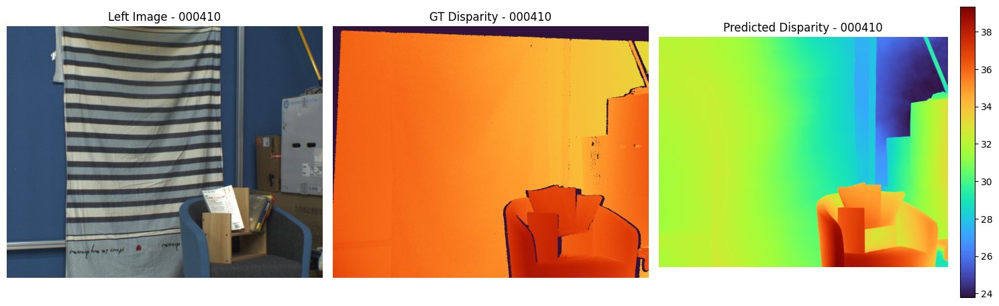

Sample: 000410
Disparity range: [23.802, 39.341]
Disparity shape: (860, 1080)
--------------------------------------------------


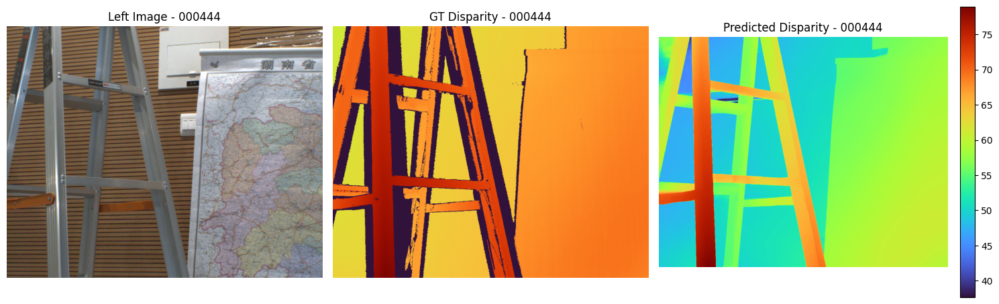

Sample: 000444
Disparity range: [37.656, 78.940]
Disparity shape: (860, 1080)
--------------------------------------------------


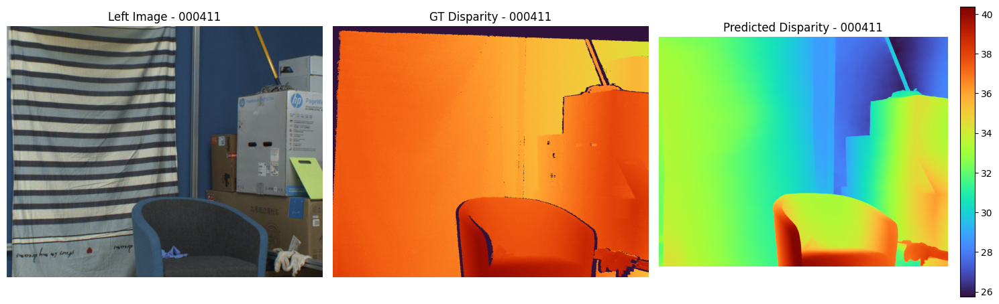

Sample: 000411
Disparity range: [25.750, 40.381]
Disparity shape: (860, 1080)
--------------------------------------------------


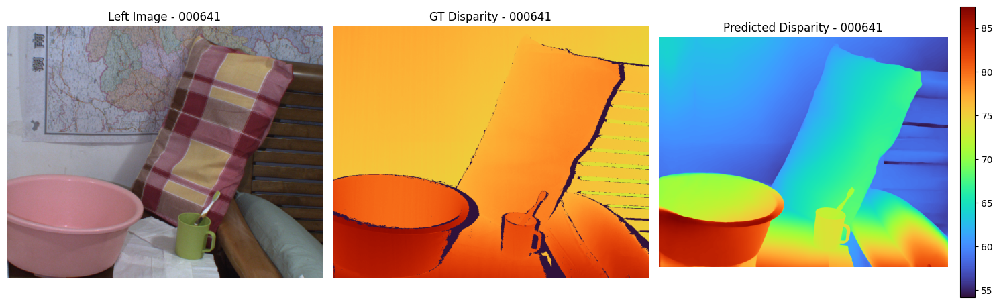

Sample: 000641
Disparity range: [54.180, 87.451]
Disparity shape: (860, 1080)
--------------------------------------------------


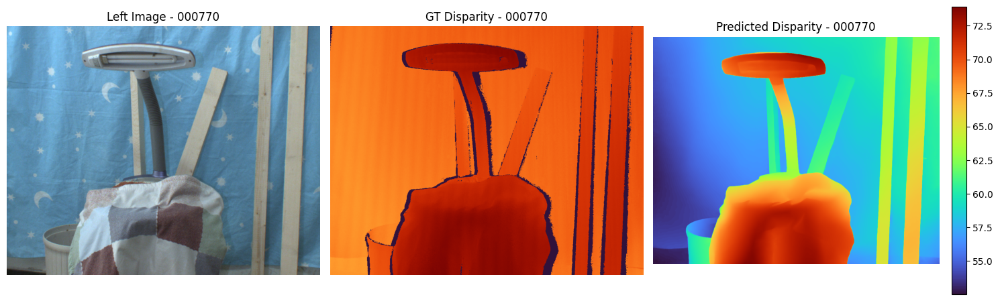

Sample: 000770
Disparity range: [52.517, 73.927]
Disparity shape: (860, 1080)
--------------------------------------------------


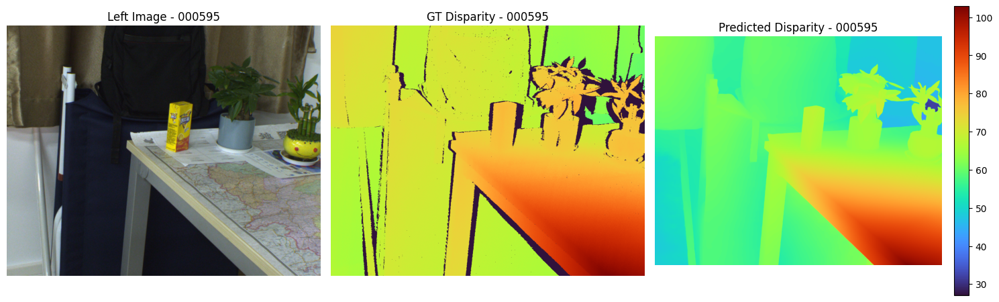

Sample: 000595
Disparity range: [27.072, 102.849]
Disparity shape: (860, 1080)
--------------------------------------------------


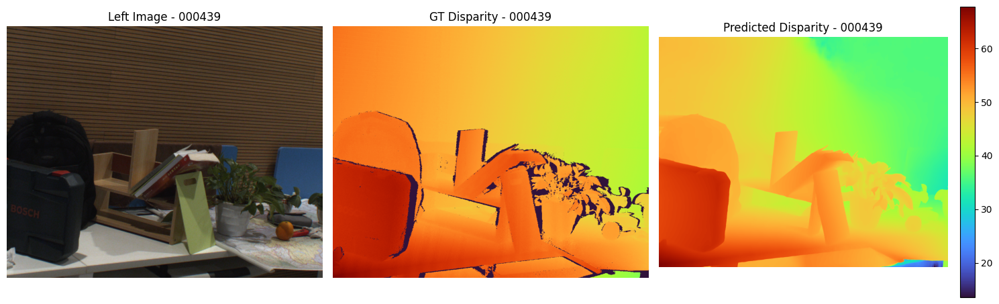

Sample: 000439
Disparity range: [13.569, 67.768]
Disparity shape: (860, 1080)
--------------------------------------------------


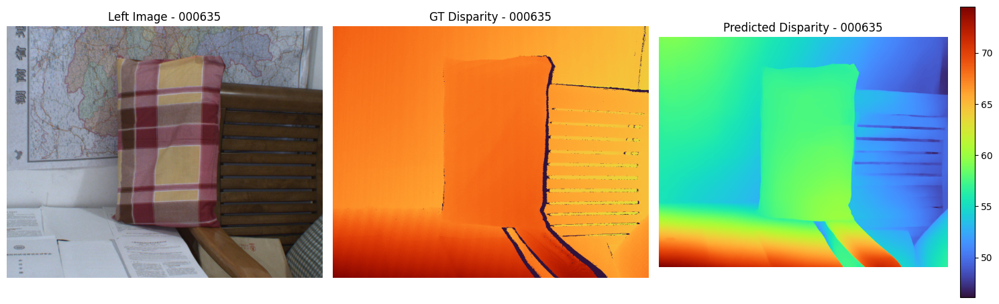

Sample: 000635
Disparity range: [46.099, 74.515]
Disparity shape: (860, 1080)
--------------------------------------------------


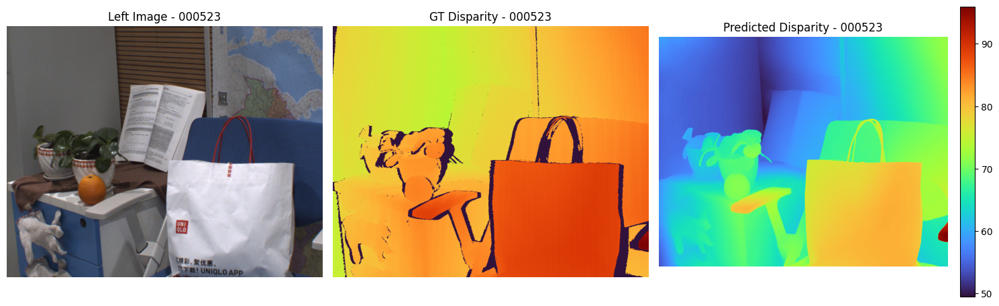

Sample: 000523
Disparity range: [49.530, 95.982]
Disparity shape: (860, 1080)
--------------------------------------------------


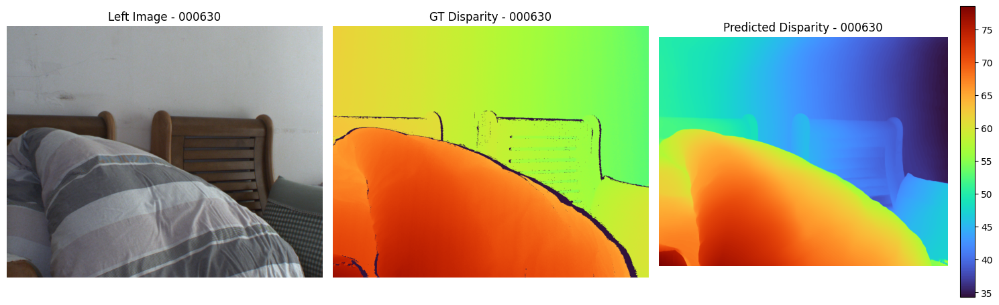

Sample: 000630
Disparity range: [34.367, 78.540]
Disparity shape: (860, 1080)
--------------------------------------------------


In [12]:
import random

def run_cres_inference(scene_ids, n_iter=20, colormap="turbo"):
    processed_samples = []

    for sid in scene_ids:
        left_path = Path("..") / "data" / "instereo2k_sample" / sid / "left.png"
        right_path = Path("..") / "data" / "instereo2k_sample" / sid / "right.png"

        if not left_path.is_file() or not right_path.is_file():
            print(f"⚠️ Scene {sid}: изображения не найдены")
            continue

        # загрузка
        left = load_image_tensor(left_path, DEVICE)
        right = load_image_tensor(right_path, DEVICE)
        left, pad_h, pad_w = pad_to_multiple(left, multiple=8)
        right, _, _ = pad_to_multiple(right, multiple=8)

        # инференс
        with torch.inference_mode():
            left_half = F.interpolate(left, scale_factor=0.5, mode="bilinear", align_corners=True)
            right_half = F.interpolate(right, scale_factor=0.5, mode="bilinear", align_corners=True)
            flow_coarse = model(left_half, right_half, iters=n_iter)
            flow = model(left, right, flow_init=flow_coarse, iters=n_iter)

        disp = flow[:, 0, :, :].squeeze(0).detach().cpu().numpy()
        if pad_h or pad_w:
            disp = disp[: disp.shape[0] - pad_h if pad_h else disp.shape[0],
                        : disp.shape[1] - pad_w if pad_w else disp.shape[1]]

        # сохранить
        results_dir = Path("..") / "results" / "task1_cres"
        results_dir.mkdir(parents=True, exist_ok=True)
        out_png = results_dir / f"disp_{sid}.png"
        out_npy = results_dir / f"disp_{sid}.npy"
        plt.imsave(out_png, disp, cmap=colormap)
        np.save(out_npy, disp)

        processed_samples.append({
            "sample_id": sid,
            "left": str(left_path),
            "png": str(out_png),
            "npy": str(out_npy),
        })

        print(f"✅ Scene {sid}: disparity saved → {out_png}, {out_npy}")

    return processed_samples


def visualize_from_npy(processed_samples, colormap="turbo", max_items=5, random_seed=42):
    if not processed_samples:
        print("Нет данных для визуализации.")
        return

    available = processed_samples
    if max_items is not None and len(available) > max_items:
        rng = random.Random(random_seed)
        available = sorted(rng.sample(available, max_items), key=lambda s: s["sample_id"])

    for sample in available:
        sid = sample["sample_id"]
        left_img = Image.open(sample["left"]).convert("RGB")
        pred_disp = np.load(sample["npy"])
        gt_disp_path = Path("..") / "data" / "instereo2k_sample" / sid / "left_disp.png"

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(left_img)
        plt.title(f"Left Image - {sid}")
        plt.axis("off")

        if gt_disp_path.exists():
            gt_disp = Image.open(gt_disp_path)
            plt.subplot(1, 3, 2)
            plt.imshow(gt_disp, cmap=colormap)
            plt.title(f"GT Disparity - {sid}")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            im = plt.imshow(pred_disp, cmap=colormap)
            plt.title(f"Predicted Disparity - {sid}")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")
        else:
            plt.subplot(1, 2, 2)
            im = plt.imshow(pred_disp, cmap=colormap)
            plt.title(f"Predicted Disparity - {sid}")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

        print(f"Sample: {sid}")
        print(f"Disparity range: [{pred_disp.min():.3f}, {pred_disp.max():.3f}]")
        print(f"Disparity shape: {pred_disp.shape}")
        print("-" * 50)



# список всех сцен
all_ids = sorted([p.name for p in (Path("..") / "data" / "instereo2k_sample").iterdir() if p.is_dir()])
# выберем случайные 5 сцен
scene_ids = random.sample(all_ids, k=10)

processed_samples = run_cres_inference(scene_ids, n_iter=20, colormap="inferno")
visualize_from_npy(processed_samples, colormap="turbo", max_items=10)


## Depth-Anything

Главная идея — обучить универсальный предиктор глубины, который работает «из коробки» на любых изображениях, без дообучения под конкретный датасет или домен. Модель обучена на огромной смеси открытых наборов с разными типами разметки (стерео, лидар, структурированный свет), что дало ей уникальную zero-shot переносимость.

In [13]:
import os
import sys
from contextlib import contextmanager
from pathlib import Path

def ensure_depth_anything_on_path(max_depth: int = 6) -> Path:
    """Locate the local Depth-Anything repo and make sure it is importable."""
    roots = []
    current = Path.cwd().resolve()
    for _ in range(max_depth + 1):
        roots.append(current)
        current = current.parent
    roots.append(Path.home().resolve())
    seen = set()
    for root in roots:
        if root in seen:
            continue
        seen.add(root)
        candidate = (root / "Depth-Anything").resolve()
        if (candidate / "depth_anything").is_dir():
            candidate_str = str(candidate)
            if candidate_str not in sys.path:
                sys.path.insert(0, candidate_str)
            return candidate
    raise ModuleNotFoundError(
        "Не удалось найти репозиторий Depth-Anything рядом с текущим проектом или в домашней директории."
    )

@contextmanager
def use_depth_anything_repo(repo_root: Path):
    """Temporarily switch CWD so torch.hub can resolve local weights."""
    repo_root = Path(repo_root).resolve()
    original_cwd = Path.cwd()
    os.chdir(repo_root)
    try:
        yield repo_root
    finally:
        os.chdir(original_cwd)

depth_anything_root = ensure_depth_anything_on_path()
print(f"Depth-Anything repo detected at: {depth_anything_root}")

from depth_anything.dpt import DepthAnything


Depth-Anything repo detected at: /Users/olgashalashova/Depth-Anything


In [14]:
import os, torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

# добавить путь к репозиторию Depth-Anything
repo_root = ensure_depth_anything_on_path()

from depth_anything.dpt import DepthAnything

# загружаем модель (Vit-Large)
device = "mps" if torch.backends.mps.is_available() else "cpu"
with use_depth_anything_repo(repo_root):
    model = DepthAnything.from_pretrained("LiheYoung/depth_anything_vitl14").to(device).eval()

# подготовка изображения
scene_path = "../data/instereo2k_sample/000401/left.png"
img = Image.open(scene_path).convert("RGB")

transform = transforms.Compose([
    transforms.Resize((518, 518)),
    transforms.ToTensor(),
])



✅ Scene 000634: depth saved → ../results/task1_depth_anything/depth_000634.png, ../results/task1_depth_anything/depth_000634.npy
✅ Scene 000500: depth saved → ../results/task1_depth_anything/depth_000500.png, ../results/task1_depth_anything/depth_000500.npy
✅ Scene 000684: depth saved → ../results/task1_depth_anything/depth_000684.png, ../results/task1_depth_anything/depth_000684.npy
✅ Scene 000672: depth saved → ../results/task1_depth_anything/depth_000672.png, ../results/task1_depth_anything/depth_000672.npy
✅ Scene 000746: depth saved → ../results/task1_depth_anything/depth_000746.png, ../results/task1_depth_anything/depth_000746.npy
✅ Scene 000690: depth saved → ../results/task1_depth_anything/depth_000690.png, ../results/task1_depth_anything/depth_000690.npy
✅ Scene 000501: depth saved → ../results/task1_depth_anything/depth_000501.png, ../results/task1_depth_anything/depth_000501.npy
✅ Scene 000573: depth saved → ../results/task1_depth_anything/depth_000573.png, ../results/task1_

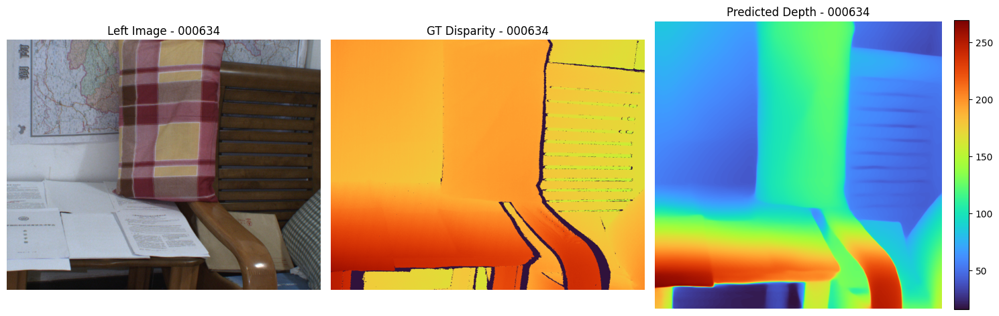

Sample: 000634
Depth range: [15.862, 268.863]
Depth shape: (518, 518)
--------------------------------------------------


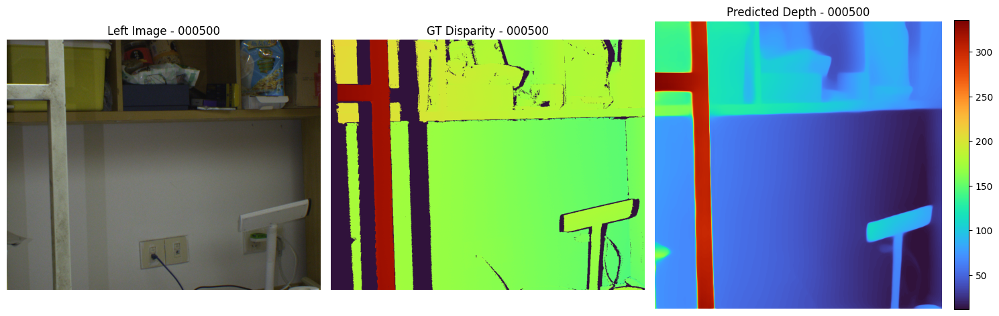

Sample: 000500
Depth range: [11.546, 335.054]
Depth shape: (518, 518)
--------------------------------------------------


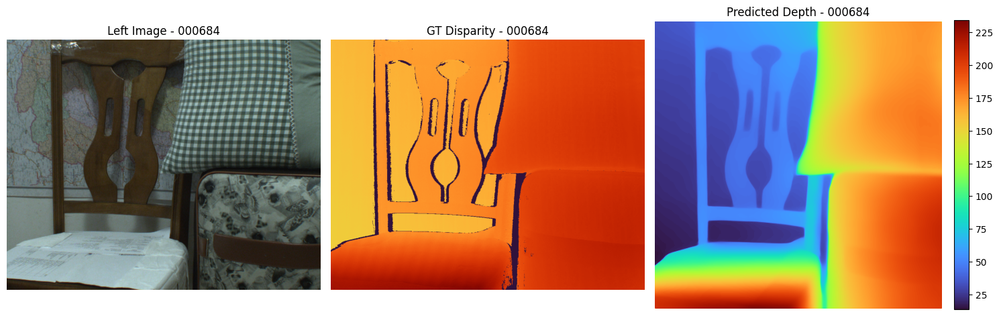

Sample: 000684
Depth range: [13.723, 234.060]
Depth shape: (518, 518)
--------------------------------------------------


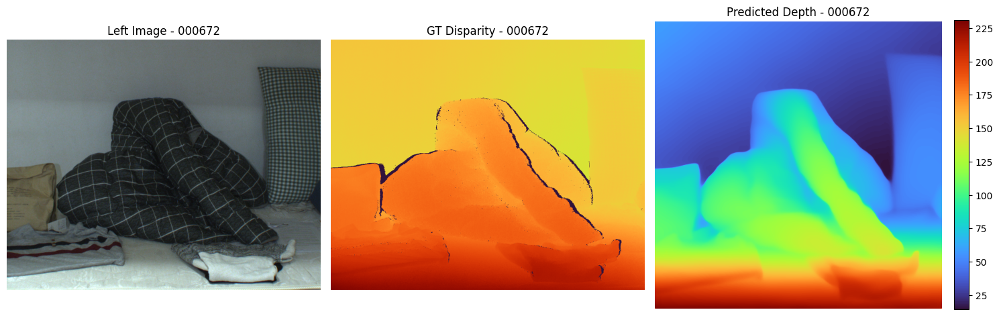

Sample: 000672
Depth range: [14.350, 230.722]
Depth shape: (518, 518)
--------------------------------------------------


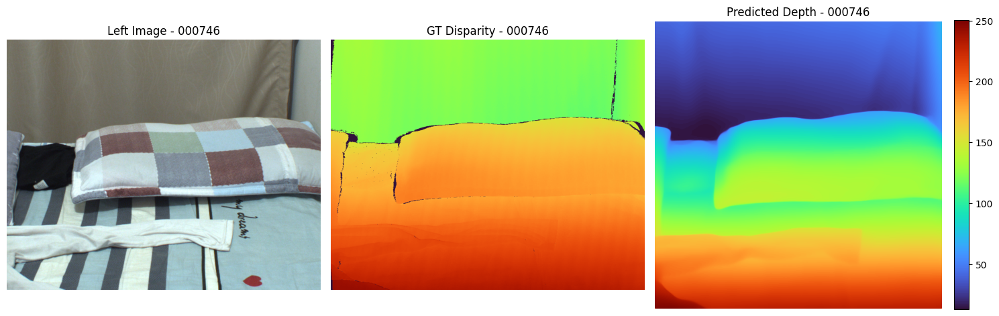

Sample: 000746
Depth range: [12.907, 250.158]
Depth shape: (518, 518)
--------------------------------------------------


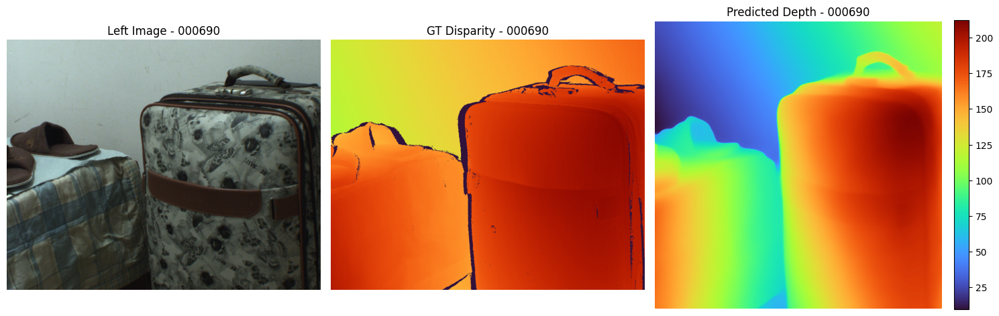

Sample: 000690
Depth range: [9.660, 211.986]
Depth shape: (518, 518)
--------------------------------------------------


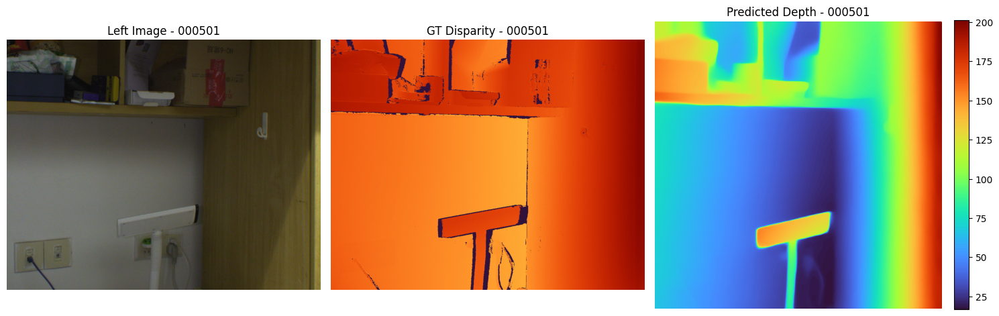

Sample: 000501
Depth range: [16.834, 200.968]
Depth shape: (518, 518)
--------------------------------------------------


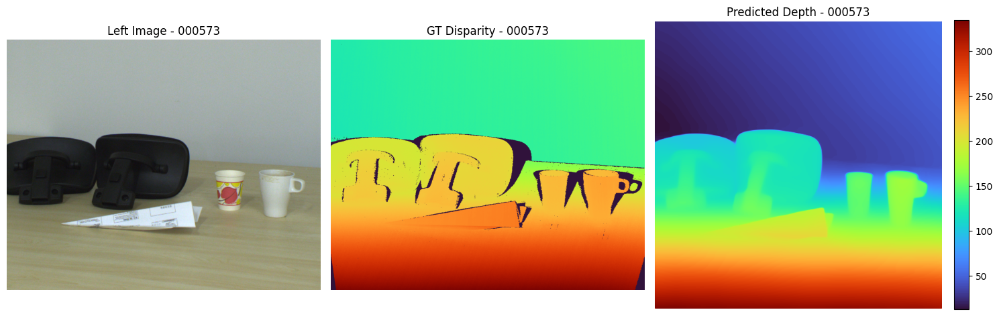

Sample: 000573
Depth range: [12.994, 333.589]
Depth shape: (518, 518)
--------------------------------------------------


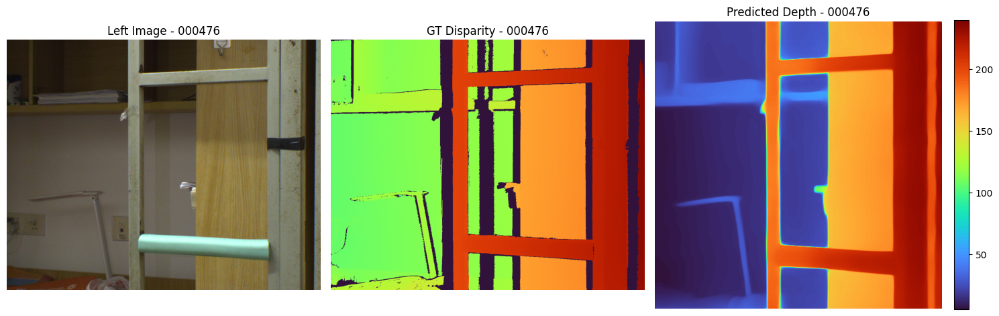

Sample: 000476
Depth range: [5.429, 239.665]
Depth shape: (518, 518)
--------------------------------------------------


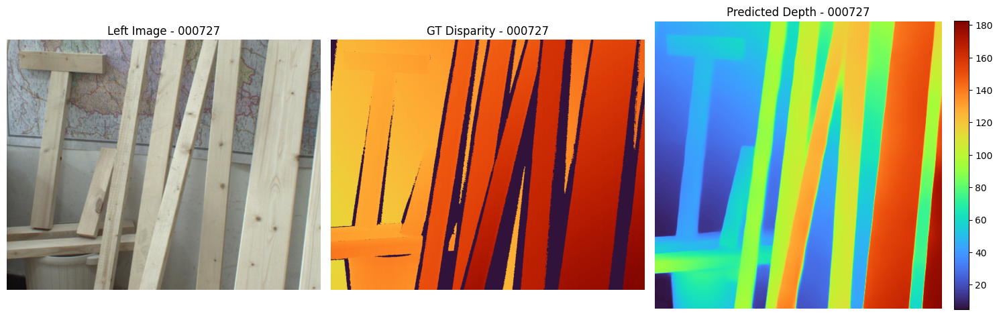

Sample: 000727
Depth range: [4.843, 182.806]
Depth shape: (518, 518)
--------------------------------------------------


In [15]:

def run_depth_anything_inference(scene_ids, colormap="inferno"):
    processed_samples = []

    for sid in scene_ids:
        img_path = Path("..") / "data" / "instereo2k_sample" / sid / "left.png"
        gt_path = Path("..") / "data" / "instereo2k_sample" / sid / "left_disp.png"

        if not img_path.is_file():
            print(f"Scene {sid}: изображение не найдено")
            continue

        img = Image.open(img_path).convert("RGB")
        inp = transform(img).unsqueeze(0).to(device)

        # инференс
        with torch.no_grad():
            depth = model(inp).squeeze().cpu().numpy()

        # сохранить
        results_dir = Path("..") / "results" / "task1_depth_anything"
        results_dir.mkdir(parents=True, exist_ok=True)
        out_png = results_dir / f"depth_{sid}.png"
        out_npy = results_dir / f"depth_{sid}.npy"
        plt.imsave(out_png, depth, cmap=colormap)
        np.save(out_npy, depth)

        processed_samples.append({
            "sample_id": sid,
            "left": str(img_path),
            "png": str(out_png),
            "npy": str(out_npy),
            "gt": str(gt_path) if gt_path.exists() else None,
        })

        print(f"✅ Scene {sid}: depth saved → {out_png}, {out_npy}")

    return processed_samples



def visualize_depth_anything(processed_samples, colormap="inferno", max_items=5, random_seed=42):
    if not processed_samples:
        print("Нет данных для визуализации.")
        return

    available = processed_samples
    if max_items is not None and len(available) > max_items:
        rng = random.Random(random_seed)
        available = sorted(rng.sample(available, max_items), key=lambda s: s["sample_id"])

    for sample in available:
        sid = sample["sample_id"]
        left_img = Image.open(sample["left"]).convert("RGB")
        pred_depth = np.load(sample["npy"])
        gt_disp_path = sample["gt"]

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(left_img)
        plt.title(f"Left Image - {sid}")
        plt.axis("off")

        if gt_disp_path and Path(gt_disp_path).exists():
            gt_disp = Image.open(gt_disp_path)
            plt.subplot(1, 3, 2)
            plt.imshow(gt_disp, cmap=colormap)
            plt.title(f"GT Disparity - {sid}")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            im = plt.imshow(pred_depth, cmap=colormap)
            plt.title(f"Predicted Depth - {sid}")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")
        else:
            plt.subplot(1, 2, 2)
            im = plt.imshow(pred_depth, cmap=colormap)
            plt.title(f"Predicted Depth - {sid}")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

        print(f"Sample: {sid}")
        print(f"Depth range: [{pred_depth.min():.3f}, {pred_depth.max():.3f}]")
        print(f"Depth shape: {pred_depth.shape}")
        print("-" * 50)


all_ids = sorted([p.name for p in (Path("..") / "data" / "instereo2k_sample").iterdir() if p.is_dir()])
scene_ids = random.sample(all_ids, k=10)

processed_samples = run_depth_anything_inference(scene_ids, colormap="inferno")
visualize_depth_anything(processed_samples, colormap="turbo", max_items=10)
